In [1]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import pandas as pd
import os

# type in the information in this cell

In [2]:
# Input information in this cell

## Set number
SetNumber = 'set2'

## change directory

os.chdir(r"O:\ImStor\sorger\data\Cytell\Kyun\cycIF_analysis_python_v3_log\set2_20170322_4CL_5h5d_pERK_singleCell")
print(os.getcwd())


## cycle number - how many rounds in cycIF?
TotalCycleNumber = 2     #cycIF cycle number

# read csv file as df

df1 = pd.read_csv('SingleCell_set2_BT483_BCDEFG.csv')
df2 = pd.read_csv('SingleCell_set2_MCF7_BCDEFG.csv')
df3 = pd.read_csv('SingleCell_set2_T47D_BCDEFG.csv')
df4 = pd.read_csv('SingleCell_set2_EFM19_BCDEFG.csv')

O:\ImStor\sorger\data\Cytell\Kyun\cycIF_analysis_python_v3_log\set2_20170322_4CL_5h5d_pERK_singleCell


In [3]:
# Generate the parameters for Cutoffs - based on the scatter plots below

Ki67negArray = list([])
RBnegArray = list([])
RBhighArray = list([])
DNACutoffArray = list([])

# Color scheme for 6 subpopulations
#color = ['magenta', 'lime', 'blue', 'aqua', 'red', 'black']

# BT483 cells

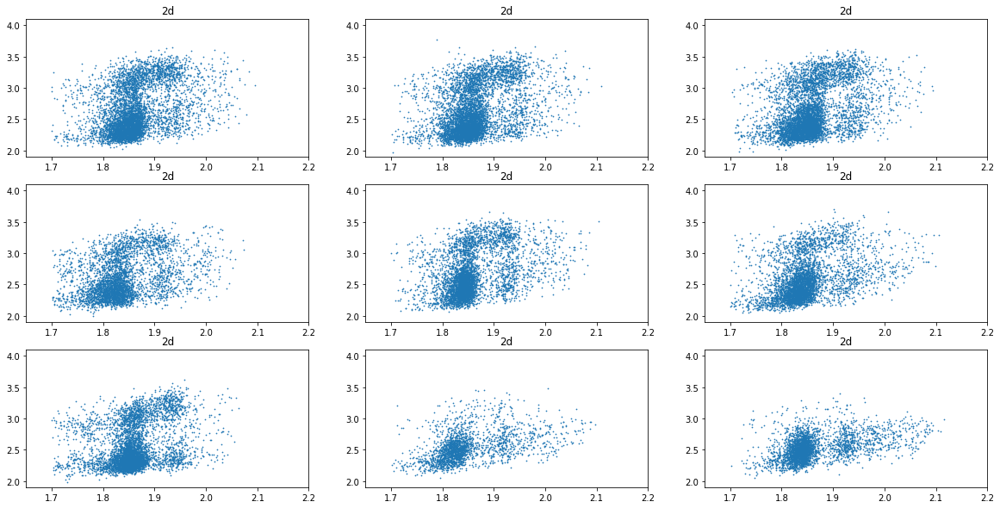

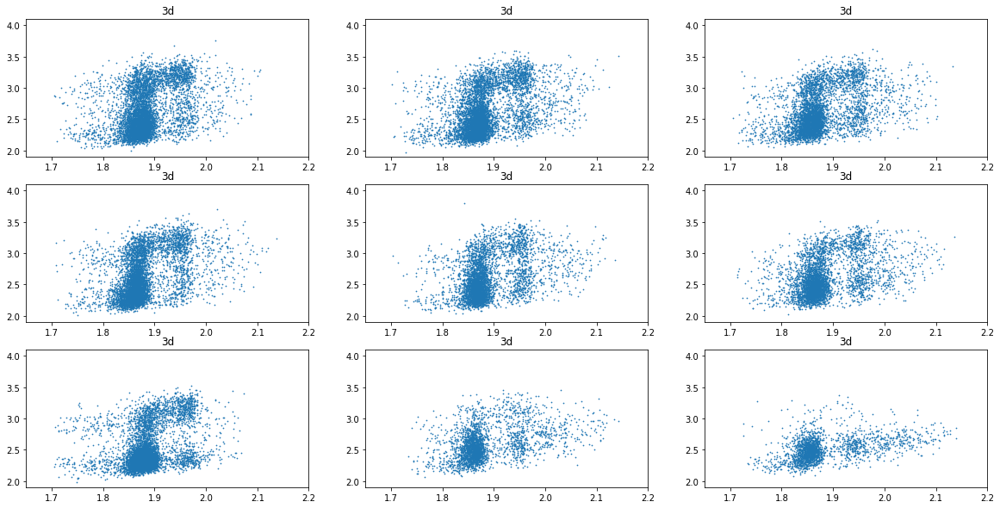

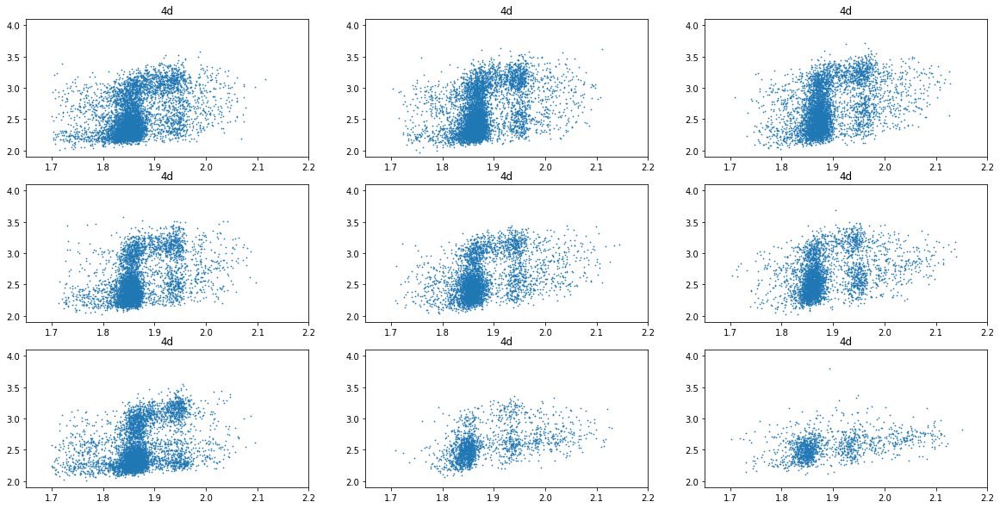

In [4]:
# scatter plot: x_DNAcontent, y_pRB

for k, CellLine in enumerate([df1]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+3*k, figsize=(20,10))

        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'] )/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            xx = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            yy = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])


            plt.scatter(xx, yy, s=0.5)
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)

plt.show()

In [5]:
# Decide the Cutoffs based on the scatter plot. This part is for BT483 cells

Ki67neg=[2.7];
RBneg=[2.6];

RBhigh=[3];

# DNA cutoff for 2N vs 4N. Modify after checking each graph
DNACutoff = 1.89*np.ones([3,9]) + np.array([[0.00, -0.0, -0.0,   #2day
                                            -0.0, -0.0, -0.0,  
                                            0.0, -0.01, -0.01 ], 
                                           [-0.0, -0.00, -0.0,   #3day
                                            -0.0, -0.0, -0.0,  
                                            0.0, -0., -0.0], 
                                           [-0.0, -0.0, -0.0,   #4day
                                            -0.0, -0.0, -0.00,  
                                            0.0, 0.0, 0.0,]])


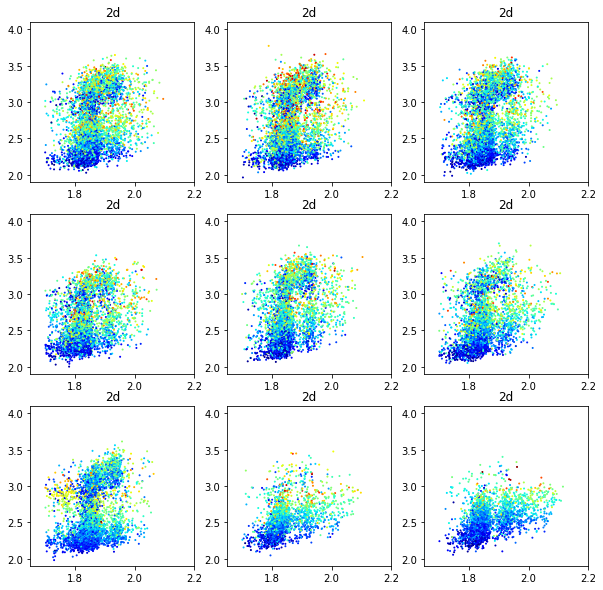

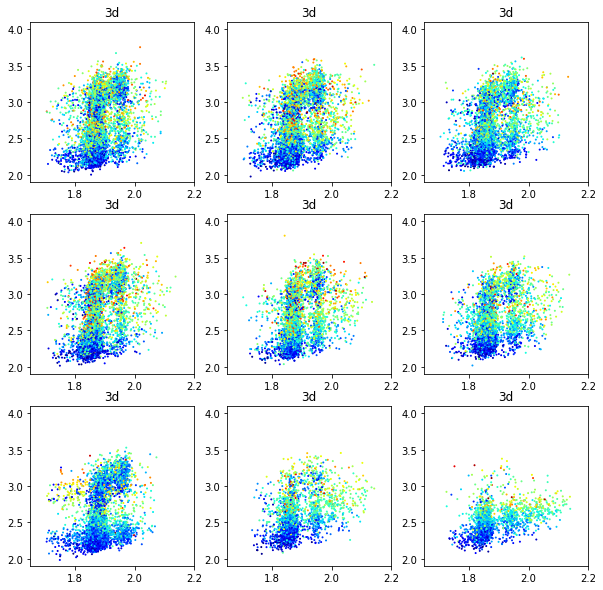

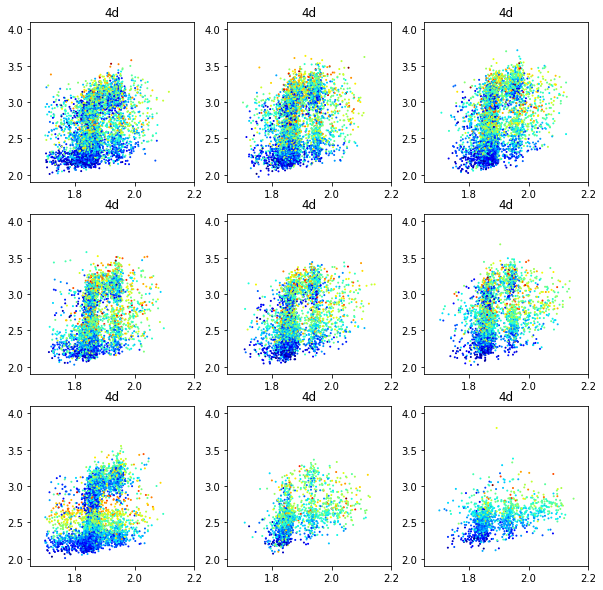

In [6]:
# Scatter plot. x:DNAcontent, y:pRB(log10)

for k, CellLine in enumerate([df1]):
    for i, time in enumerate(['2d', '3d', '4d']):
        f= plt.figure(i+1+3*k, figsize=(10,10))
        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'] )/ConDNA*2
            
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex = np.log10(CellLine.loc[idx & idx_live]['pErk_N'])
            
            plt.scatter(x_all, y_all, s=1, c=colorIndex, cmap='jet')
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)
plt.show()

In [7]:
# Save parameters, BT483

Ki67negArray = Ki67negArray + list(Ki67neg)
RBnegArray = RBnegArray + list(RBneg)
RBhighArray = RBhighArray + list(RBhigh)
DNACutoffArray = DNACutoffArray + [list(DNACutoff)]

# MCF7 cells

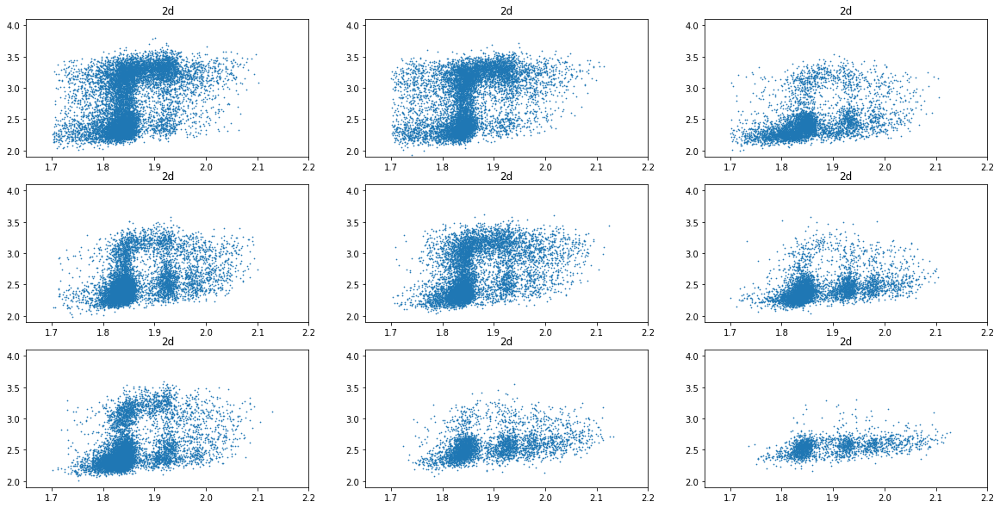

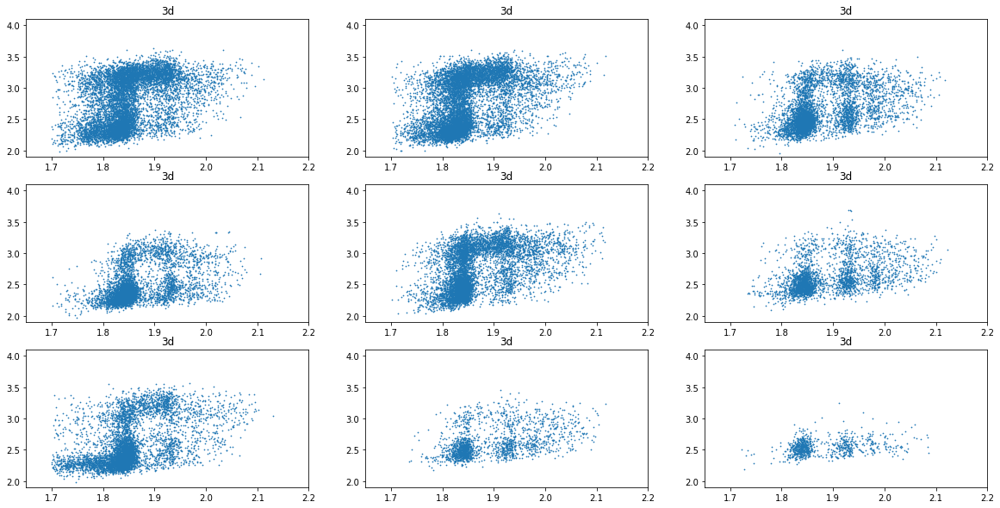

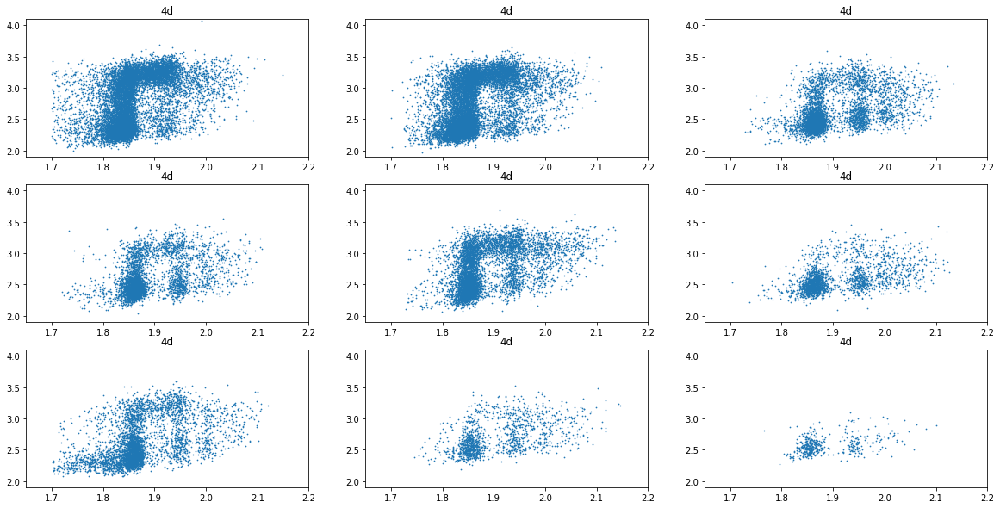

In [8]:
# scatter plot: x_DNAcontent, y_pRB

for k, CellLine in enumerate([df2]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+3*k, figsize=(20,10))

        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'])/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            xx = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            yy = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])


            plt.scatter(xx, yy, s=0.5)
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)

plt.show()

In [9]:
# Decide the Cutoffs based on the scatter plot. This part is for BT483 cells
Ki67neg=[2.7];
RBneg=[2.6];

RBhigh=[3];

# DNA cutoff for 2N vs 4N. Modify after checking each graph
DNACutoff = 1.87*np.ones([3,9]) + np.array([[-0.0, -0.0, 0.02,   #2day
                                            0.01, 0.01, 0.02,  
                                            0.01, 0.02, 0.02 ], 
                                           [-0.01, -0.01, 0.0,   #2day
                                            0.01, 0.01, 0.02,  
                                            0.005, 0.01, 0.02 ], 
                                           [-0.01, -0.01, 0.02,   #2day
                                            0.01, 0.01, 0.01,  
                                            0.03, 0.01, 0.03 ]
                                           ])

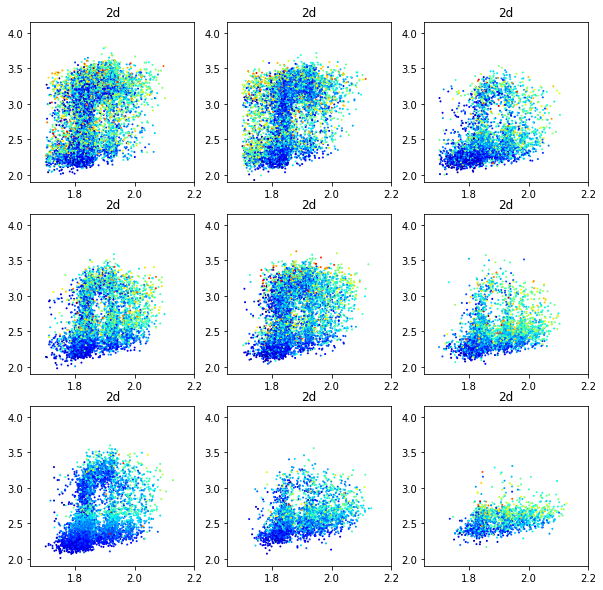

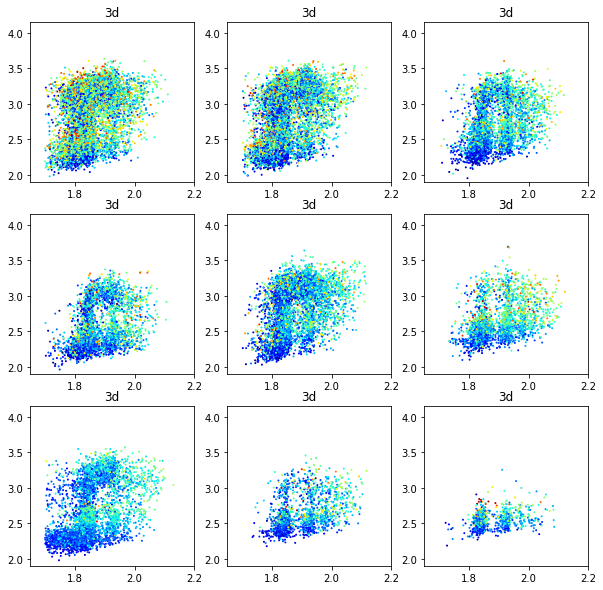

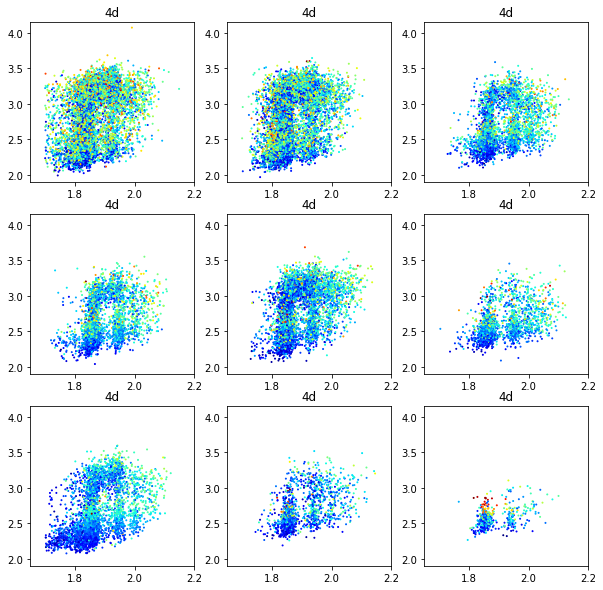

In [10]:
# Scatter plot. x:DNAcontent, y:pRB(log10)

for k, CellLine in enumerate([df2]):
    for i, time in enumerate(['2d', '3d', '4d']):
        f= plt.figure(i+1+3*k, figsize=(10,10))
        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']  ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'] )/ConDNA*2
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            colorIndex = np.log10(CellLine.loc[idx & idx_live]['pErk_N'])
            
            plt.scatter(x_all, y_all, s=1, c=colorIndex, cmap='jet')
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.15)
            plt.title(time)
plt.show()

In [11]:
# Save parameters, BT483, MCF7

Ki67negArray = Ki67negArray + list(Ki67neg)
RBnegArray = RBnegArray + list(RBneg)
RBhighArray = RBhighArray + list(RBhigh)
DNACutoffArray = DNACutoffArray + [list(DNACutoff)]

# T47D cells

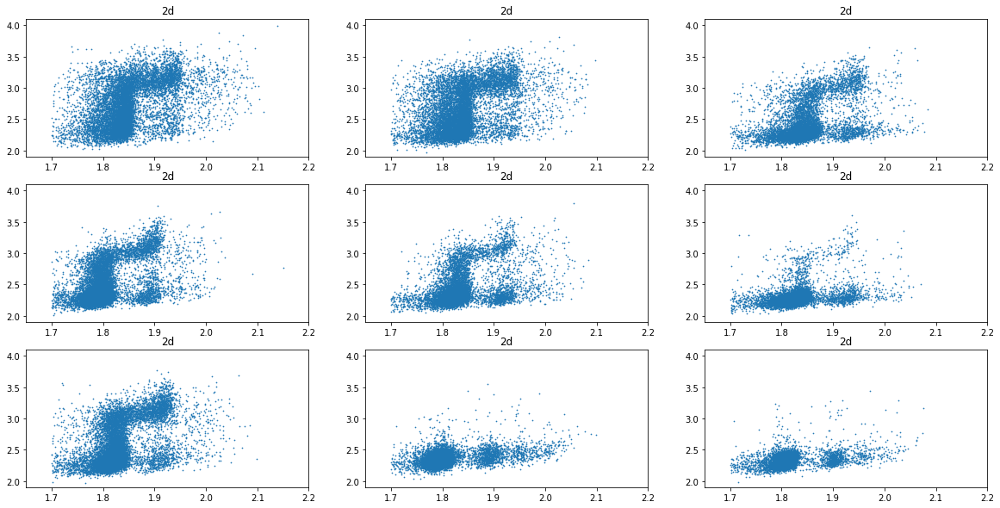

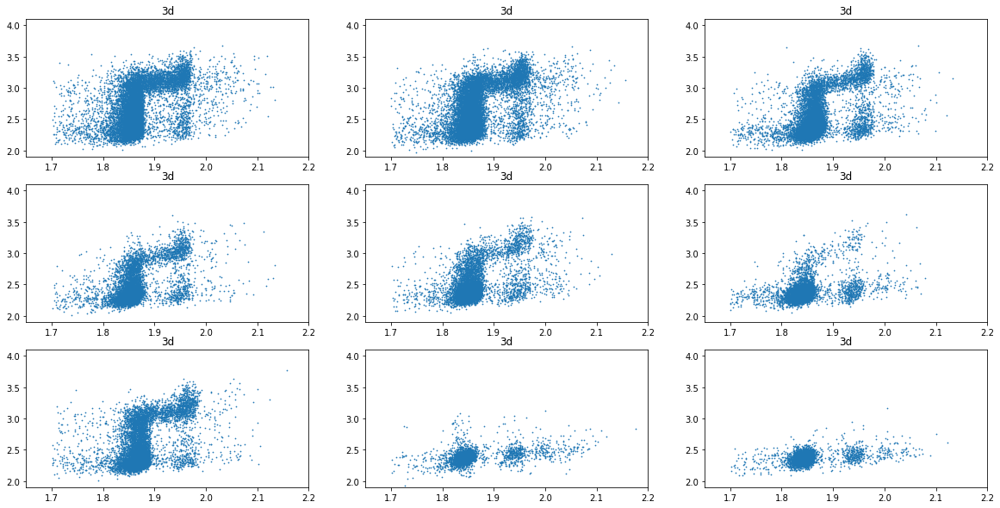

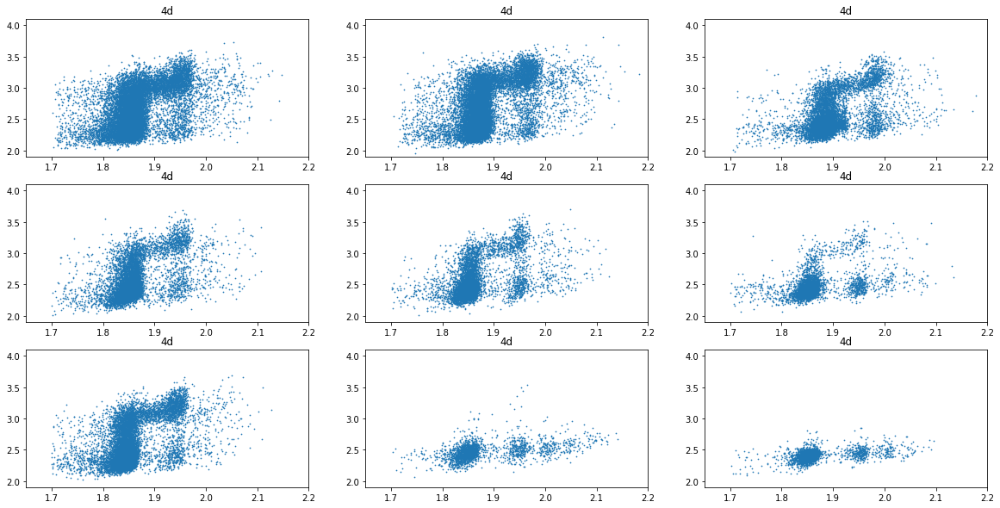

In [12]:
# scatter plot: x_DNAcontent, y_pRB

for k, CellLine in enumerate([df3]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+3*k, figsize=(20,10))

        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N']  )/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            xx = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            yy = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])


            plt.scatter(xx, yy, s=0.5)
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)

plt.show()

In [13]:
# Decide the Cutoffs based on the scatter plot. This part is for BT483 cells
Ki67neg=[2.7];
RBneg=[2.6];

RBhigh=[3];

# DNA cutoff for 2N vs 4N. Modify after checking each graph
DNACutoff = 2*np.ones([3,9]) + np.array([[-0.13, -0.12, -0.11,   #2day
                                            -0.16, -0.135, -0.135,  
                                            -0.13, -0.17, -0.14 ], 
                                           [-0.11, -0.1, -0.1,   #2day
                                            -0.1, -0.1, -0.11,  
                                            -0.09, -0.17, -0.14 ], 
                                           [-0.1, -0.1, -0.08,   #2day
                                            -0.11, -0.1, -0.12,  
                                            -0.11, -0.13, -0.11 ]
                                          ])

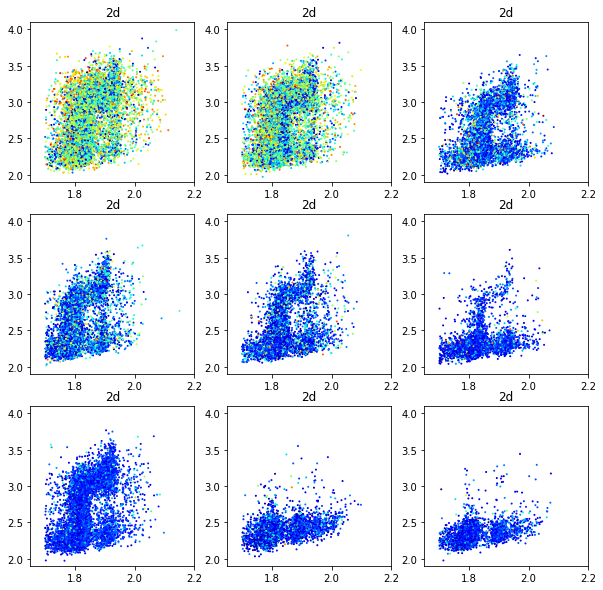

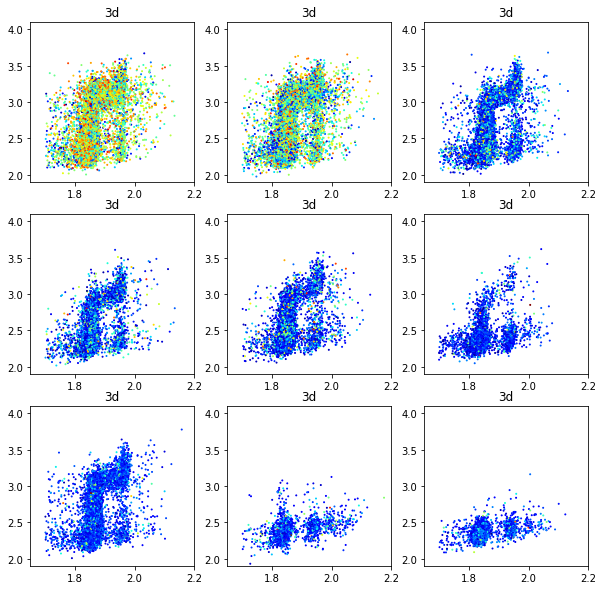

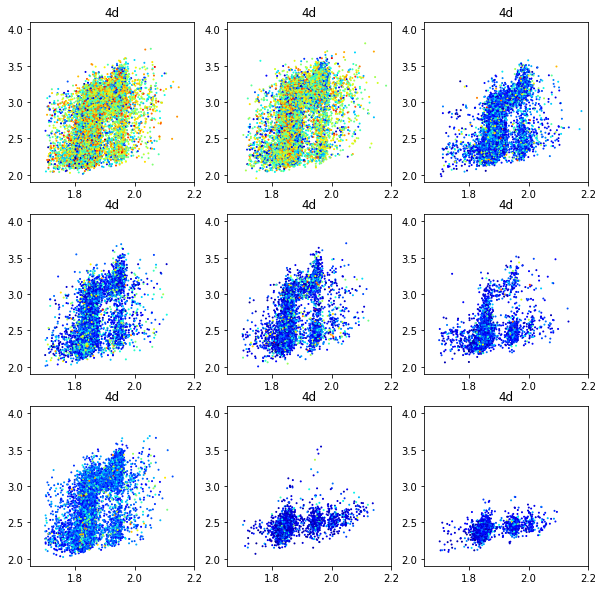

In [14]:
# Scatter plot. x:DNAcontent, y:pRB(log10)

for k, CellLine in enumerate([df3]):
    for i, time in enumerate(['2d', '3d', '4d']):
        f= plt.figure(i+1+3*k, figsize=(10,10))
        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                 ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N']  )/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex = np.log10(CellLine.loc[idx & idx_live]['pErk_N'])
            
            plt.scatter(x_all, y_all, s=1, c=colorIndex, cmap='jet')
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)
plt.show()

In [15]:
# Save parameters, BT483, MCF7, T47D

Ki67negArray = Ki67negArray + list(Ki67neg)
RBnegArray = RBnegArray + list(RBneg)
RBhighArray = RBhighArray + list(RBhigh)
DNACutoffArray = DNACutoffArray + [list(DNACutoff)]

# EFM19 cells

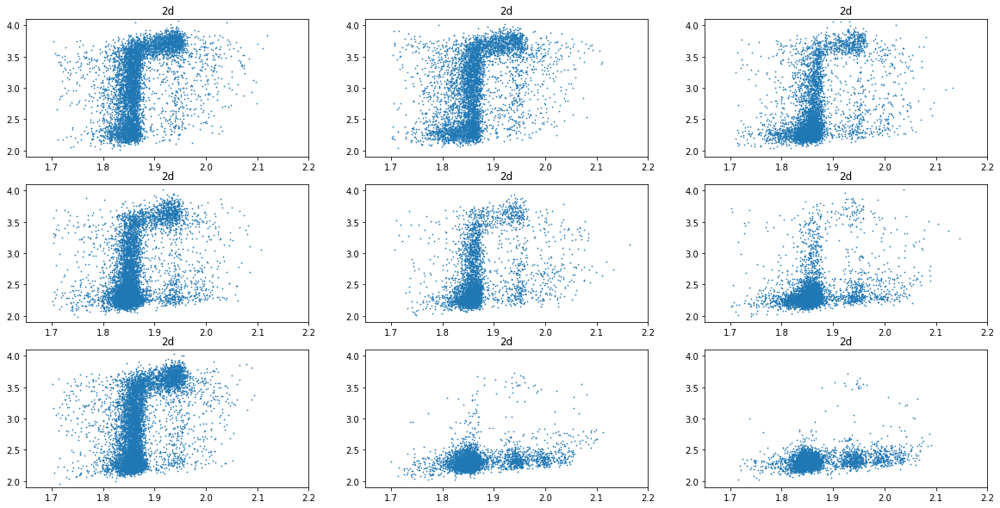

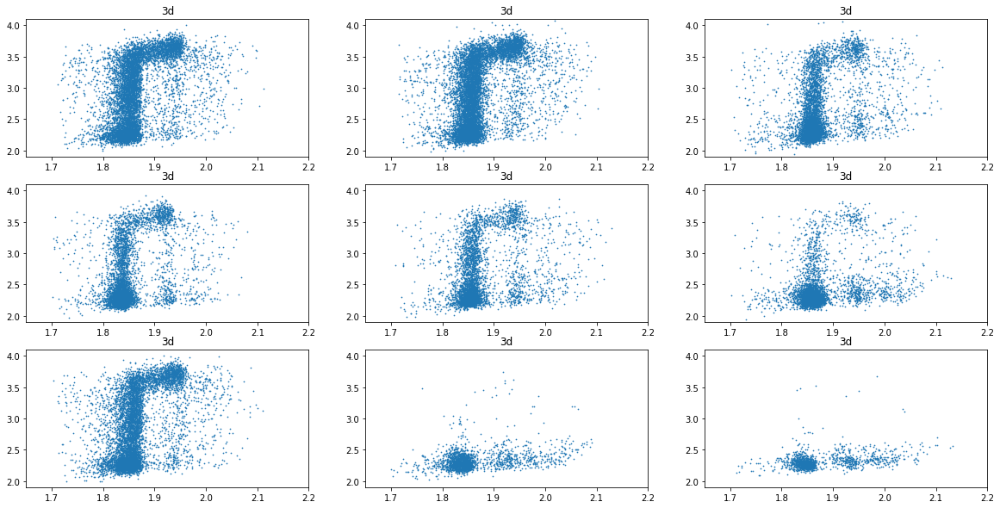

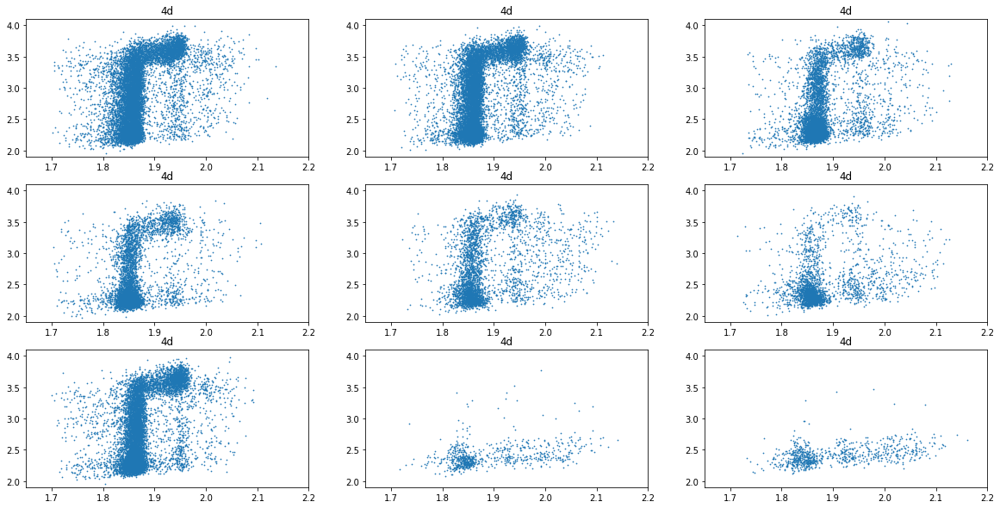

In [16]:
# scatter plot: x_DNAcontent, y_pRB

for k, CellLine in enumerate([df4]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+3*k, figsize=(20,10))

        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content'] ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'])/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            xx = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            yy = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])


            plt.scatter(xx, yy, s=0.5)
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.1)
            plt.title(time)

plt.show()

In [17]:
# Decide the Cutoffs based on the scatter plot. This part is for BT483 cells
Ki67neg=[2.7];
RBneg=[2.6];

RBhigh=[3.15];

# DNA cutoff for 2N vs 4N. Modify after checking each graph
DNACutoff = 2*np.ones([3,9]) + np.array([[-0.13, -0.1, -0.12,   #2day
                                            -0.12, -0.13, -0.13,  
                                            -0.12, -0.12, -0.12 ], 
                                           [-0.1, -0.11, -0.1,   #2day
                                            -0.12, -0.1, -0.1,  
                                            -0.1, -0.1, -0.09 ], 
                                           [-0.1, -0.1, -0.09,   #2day
                                            -0.1, -0.085, -0.11,  
                                            -0.11, -0.13, -0.1 ]
                                          ])

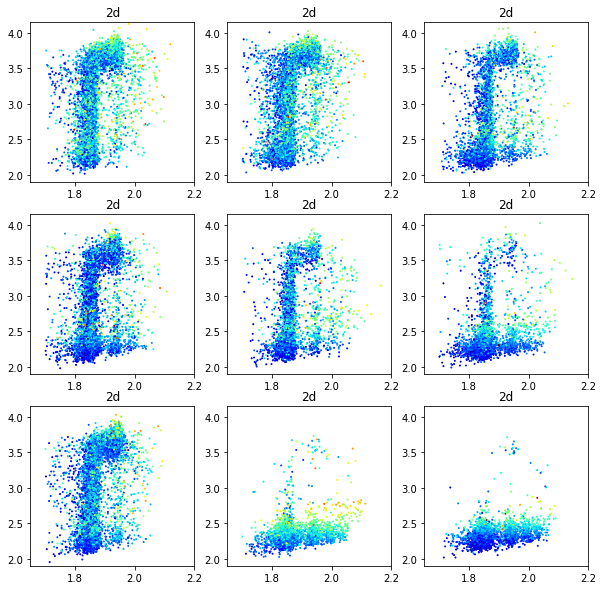

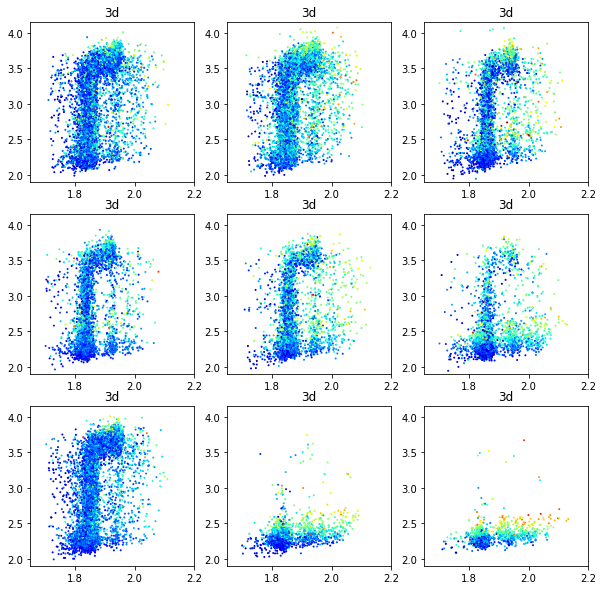

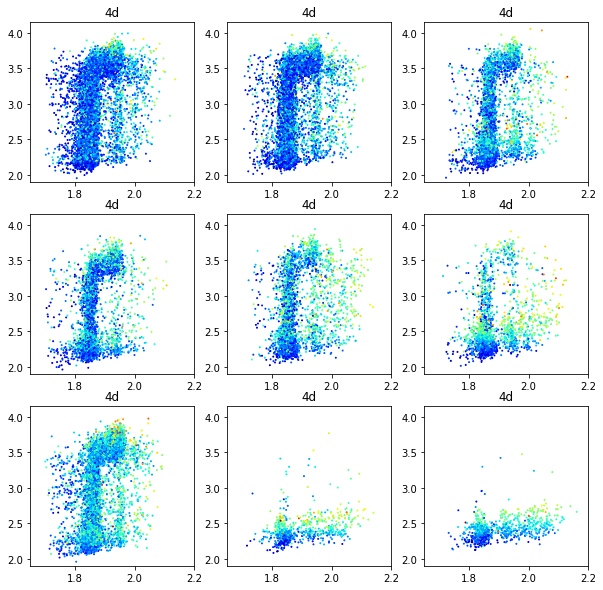

In [18]:
# Scatter plot. x:DNAcontent, y:pRB(log10)

for k, CellLine in enumerate([df4]):
    for i, time in enumerate(['2d', '3d', '4d']):
        f= plt.figure(i+1+3*k, figsize=(10,10))
        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if SelectedDrug == 'DMSO':
                ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']  ), 98)

            CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content'] )/ConDNA*2
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex = np.log10(CellLine.loc[idx & idx_live]['pErk_N'])
            
            plt.scatter(x_all, y_all, s=1, c=colorIndex, cmap='jet')
            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 4.15)
            plt.title(time)
plt.show()

In [19]:
# Save parameters, BT483, MCF7, T47D, EFM19

Ki67negArray = Ki67negArray + list(Ki67neg)
RBnegArray = RBnegArray + list(RBneg)
RBhighArray = RBhighArray + list(RBhigh)
DNACutoffArray = DNACutoffArray + [list(DNACutoff)]

# Summary

In [20]:
print(Ki67negArray)
print(RBnegArray)
print(RBhighArray)
DNACutoffArray

[2.7, 2.7, 2.7, 2.7]
[2.6, 2.6, 2.6, 2.6]
[3, 3, 3, 3.15]


[[array([ 1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.88,  1.88]),
  array([ 1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89]),
  array([ 1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89,  1.89])],
 [array([ 1.87,  1.87,  1.89,  1.88,  1.88,  1.89,  1.88,  1.89,  1.89]),
  array([ 1.86 ,  1.86 ,  1.87 ,  1.88 ,  1.88 ,  1.89 ,  1.875,  1.88 ,
          1.89 ]),
  array([ 1.86,  1.86,  1.89,  1.88,  1.88,  1.88,  1.9 ,  1.88,  1.9 ])],
 [array([ 1.87 ,  1.88 ,  1.89 ,  1.84 ,  1.865,  1.865,  1.87 ,  1.83 ,
          1.86 ]),
  array([ 1.89,  1.9 ,  1.9 ,  1.9 ,  1.9 ,  1.89,  1.91,  1.83,  1.86]),
  array([ 1.9 ,  1.9 ,  1.92,  1.89,  1.9 ,  1.88,  1.89,  1.87,  1.89])],
 [array([ 1.87,  1.9 ,  1.88,  1.88,  1.87,  1.87,  1.88,  1.88,  1.88]),
  array([ 1.9 ,  1.89,  1.9 ,  1.88,  1.9 ,  1.9 ,  1.9 ,  1.9 ,  1.91]),
  array([ 1.9  ,  1.9  ,  1.91 ,  1.9  ,  1.915,  1.89 ,  1.89 ,  1.87 ,  1.9  ])]]

# Final, to make dataframe of summary (df_Sum)

In [21]:
# Create lists with the different factors.

CellNameList = ['BT483', 'MCF7', 'T47D', 'EFM19']
Treatment = ['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']
Time = ['2d','3d','4d']
Population = ['Pop2', 'Pop3', 'Pop4', 'Pop5', 'Pop6', 'Pop1']
              
# Generate a dataframe with all combinations of all factors (Cartesian product).
df_Sum = pd.DataFrame(list(itertools.product(
    CellNameList, Treatment, Time, Population
)))
df_Sum.columns = ['CellLine', 'Treatment' , 'Time', 'Population']

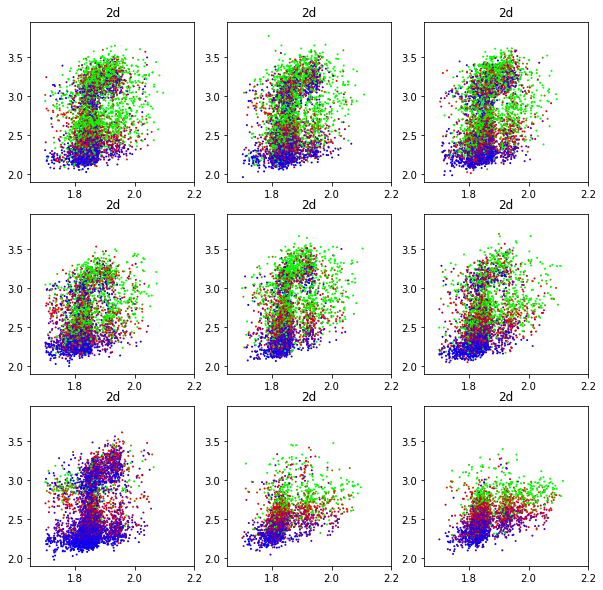

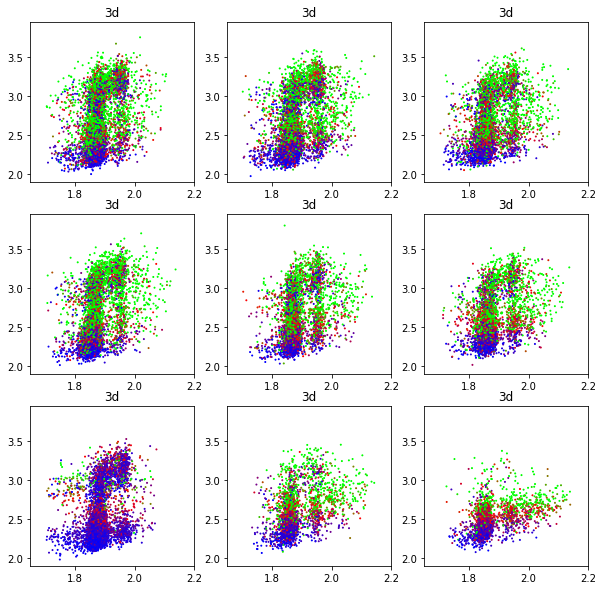

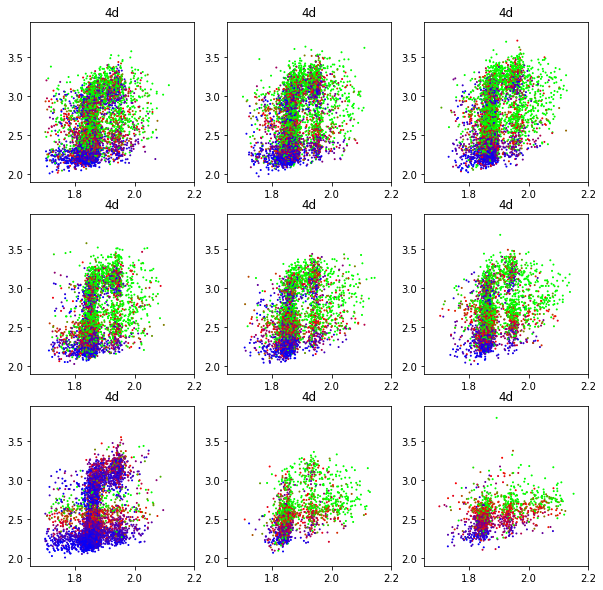

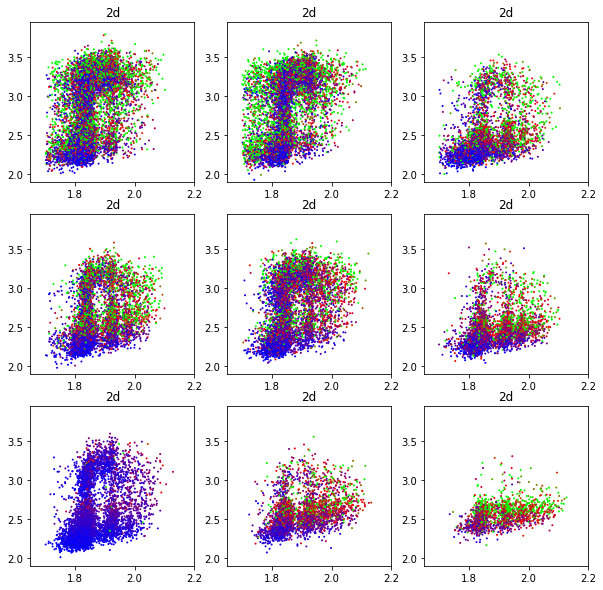

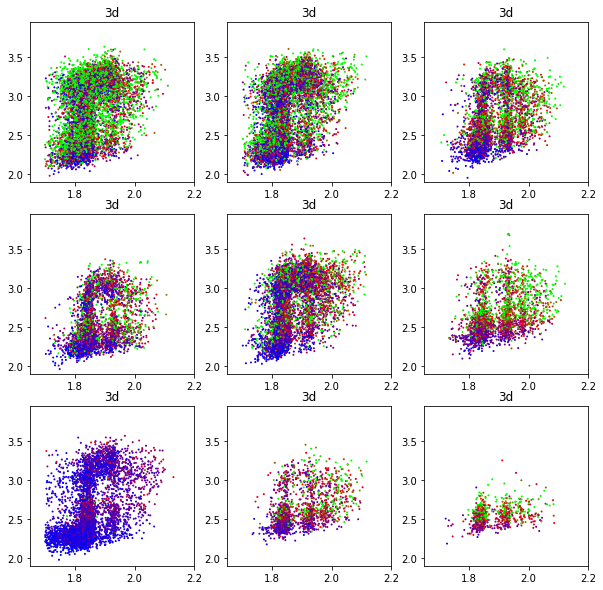

...

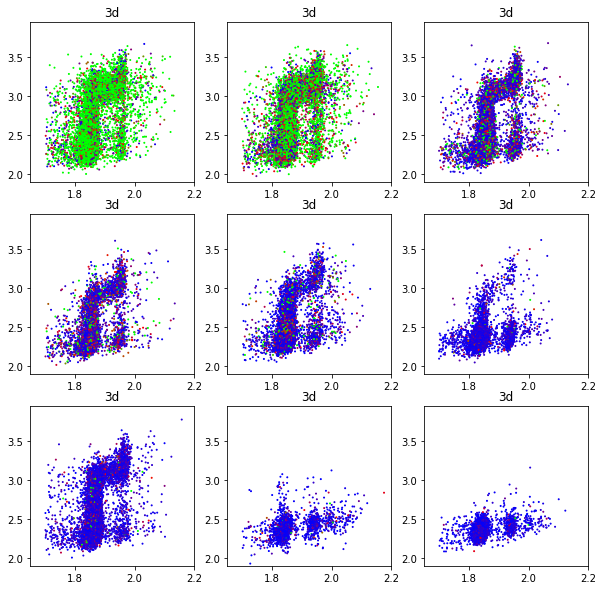

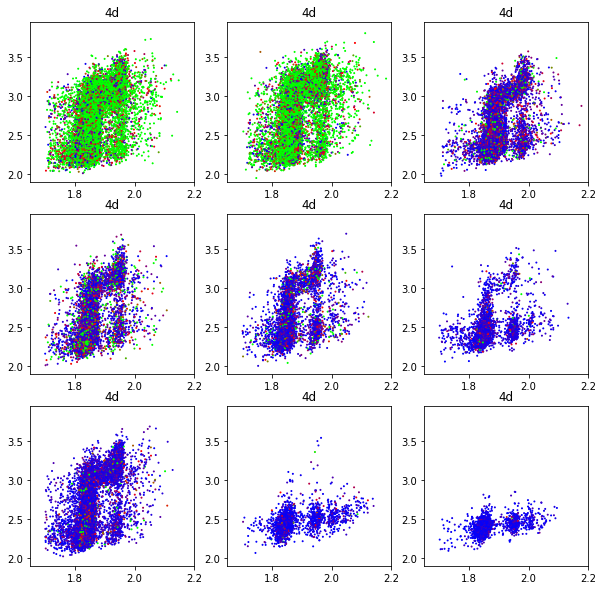

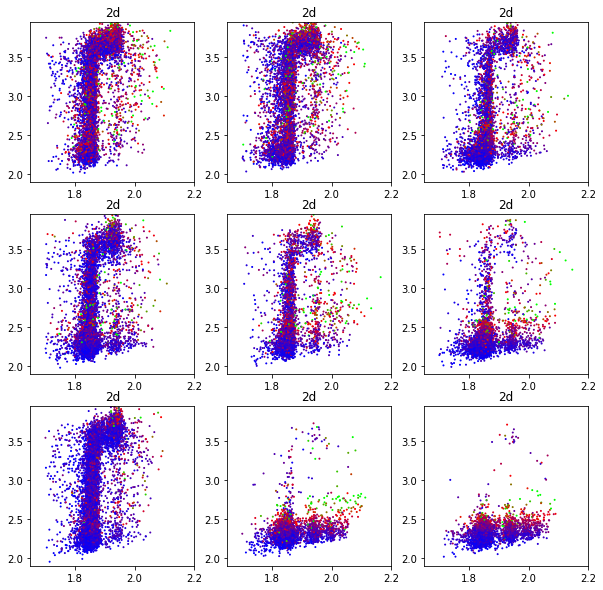

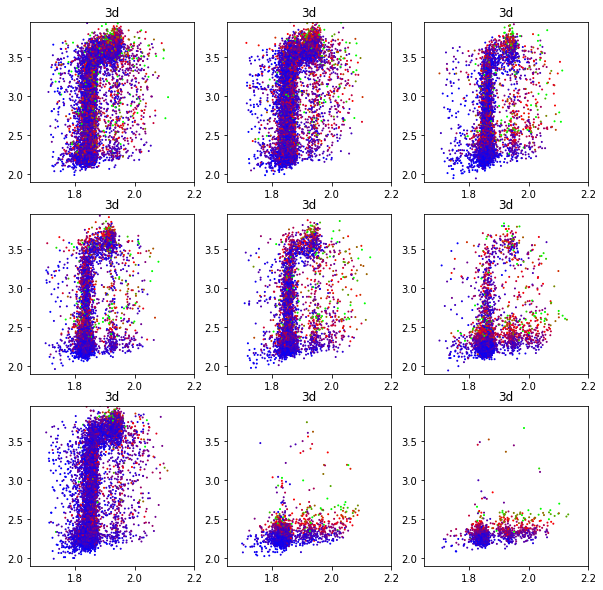

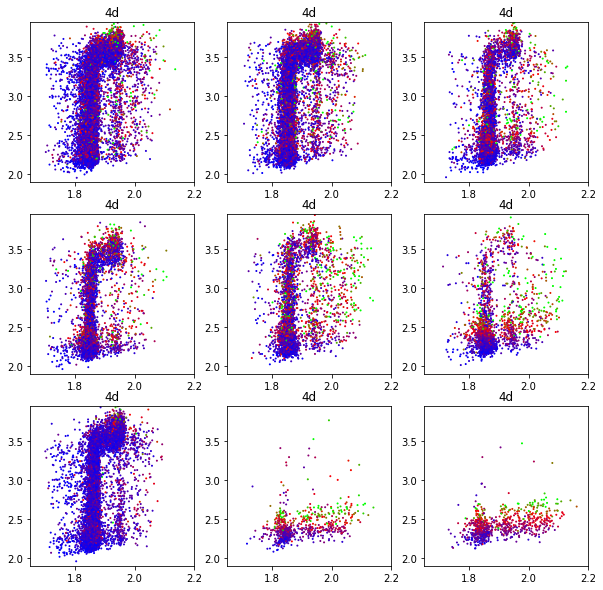

In [22]:
for k, CellLine in enumerate([df1, df2, df3, df4]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+3*k, figsize=(10,10))

        for num, SelectedDrug in enumerate(['DMSO', 'BYL0.03', 'F+BYL0.03','Fulv', 'BYL0.3','F+BYL0.3','Tram', 'BYL3','F+BYL3']):
            plt.subplot(3, 3, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if k==2:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N']  ), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N'] )/ConDNA*2
 
            else:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(CellLine.loc[idx]['Content']), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10(CellLine.loc[idx]['Content'])/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex = CellLine.loc[idx & idx_live]['pErk_N']
            
            plt.scatter(x_all, y_all, s=1, c=colorIndex, cmap='brg', vmin=150, vmax=1500)

            plt.xlim(1.65, 2.2)
            plt.ylim(1.9, 3.95)
            plt.title(time)


                                    
plt.show()


 
# % Column 1-10: DAPI Cycle0 (Nuc 1-5, Cyto 6-10)
# % Column 11-20: DAPI Cycle1
# % Column 21-30: Cy3 Cycle0
# % Column 31-40: Cy3 Cycle1 :pRB
# % Column 41-50: Cy5 Cycle0 :pErk
# % Column 51-60: Cy5 Cycle1 :pS6-235
# % Column 61-70: FITC Cycle0
# % Column 71-80: FITC Cycle1 :Ki67

In [25]:
yLimValue1 = np.array([1.9, 1.9, 1.9, 1.9])
yLimValue2 = np.array([3.9, 3.5, 3.9, 4])

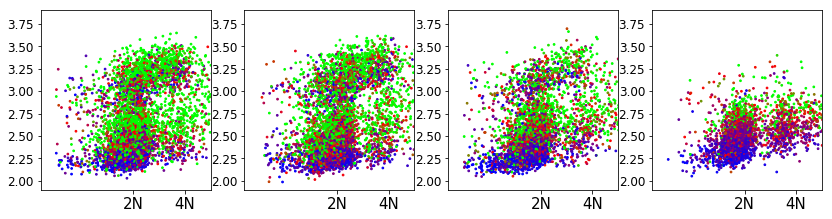

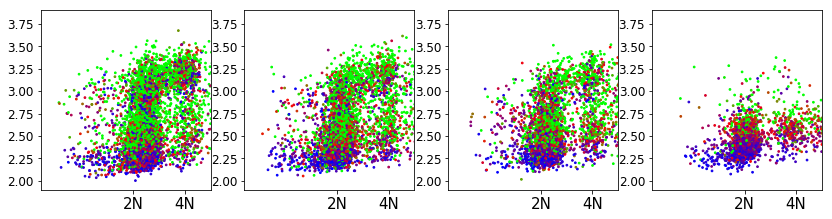

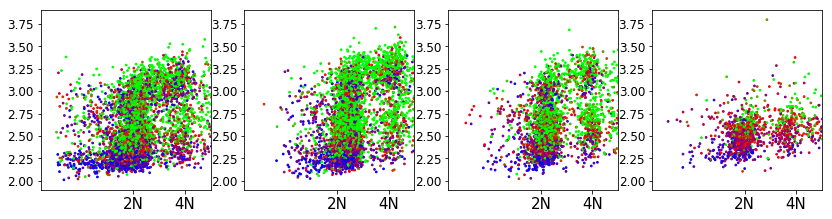

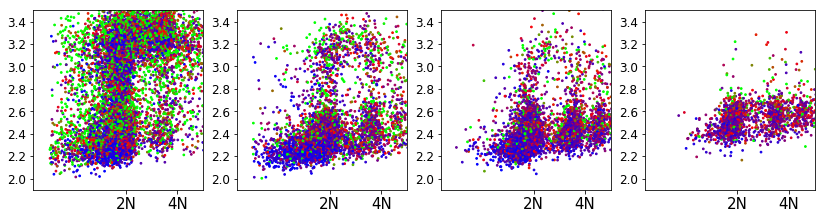

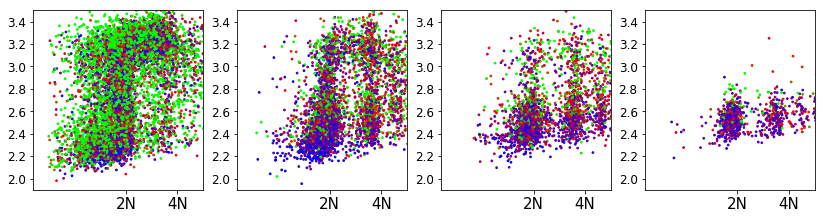

...

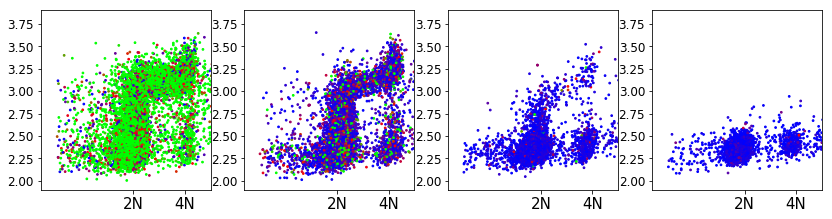

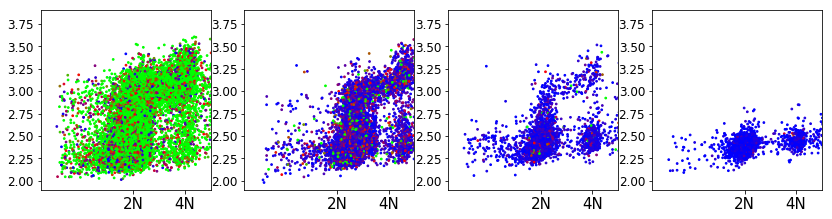

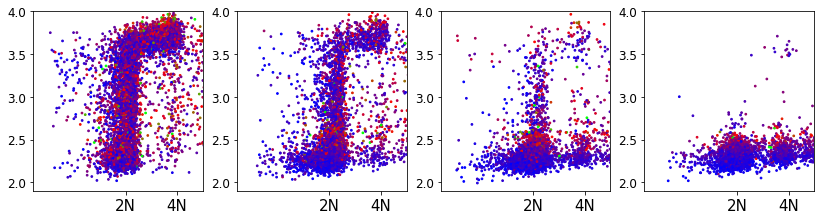

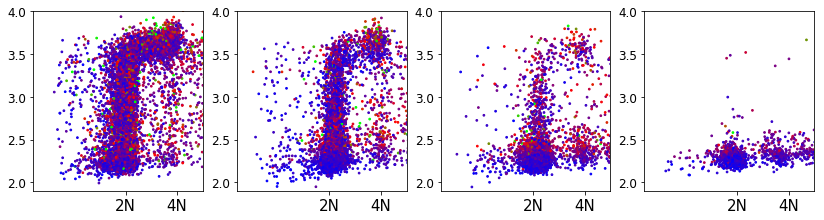

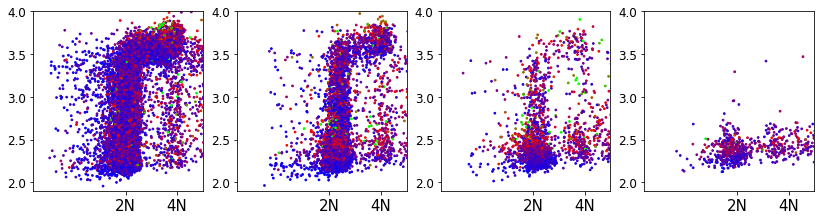

In [26]:
for k, CellLine in enumerate([df1, df2, df3, df4]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+4*k, figsize=(14,3.3))

        for num, SelectedDrug in enumerate(['DMSO', 'F+BYL0.03', 'F+BYL0.3','F+BYL3']):
            plt.subplot(1, 4, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if k==2:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N']  ), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N'] )/ConDNA*2
 
            else:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(CellLine.loc[idx]['Content']), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10(CellLine.loc[idx]['Content'])/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex = CellLine.loc[idx & idx_live]['pErk_C']
            
            plt.scatter(x_all, y_all, s=3, c=colorIndex, cmap='brg', vmin=170, vmax=1700)

            plt.xlim(1.67, 2)
            plt.ylim([yLimValue1[k], yLimValue2[k]])
            #plt.title(time)
            plt.xticks([1.85, 1.95], ['2N', '4N'])
            plt.xticks(fontsize=15)
            
            plt.yticks(fontsize=12)


#plt.colorbar()                                    
plt.show()

In [28]:
from matplotlib import cm

yLimValue1 = np.array([1.9, 1.9, 1.9, 1.9])
yLimValue2 = np.array([3.8, 3.4, 3.8, 4])

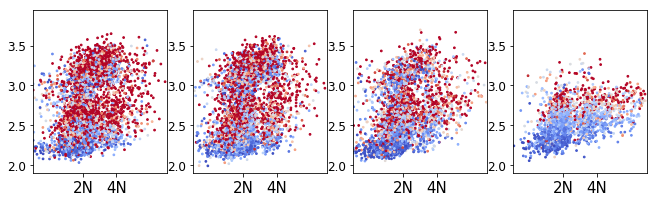

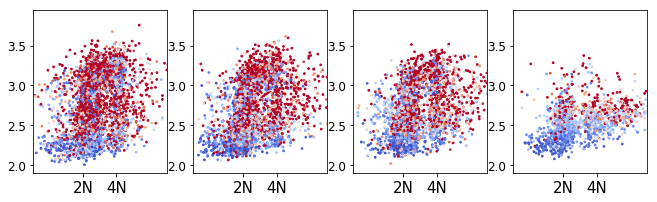

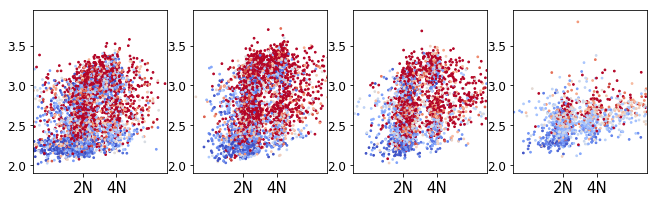

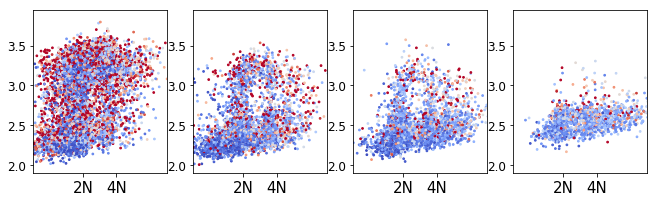

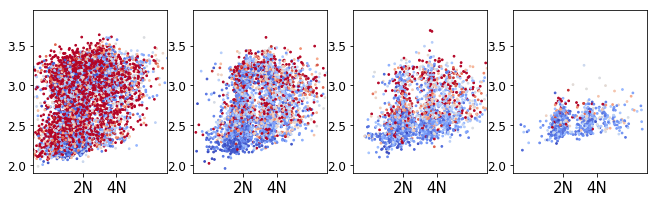

...

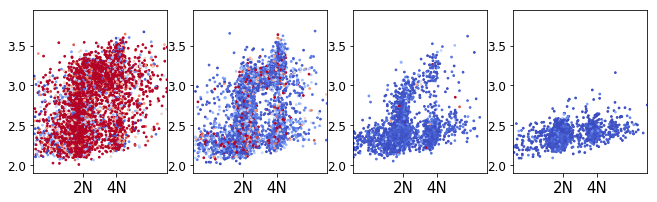

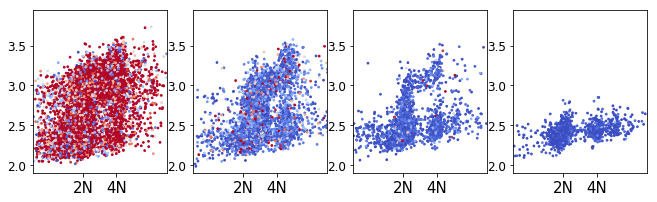

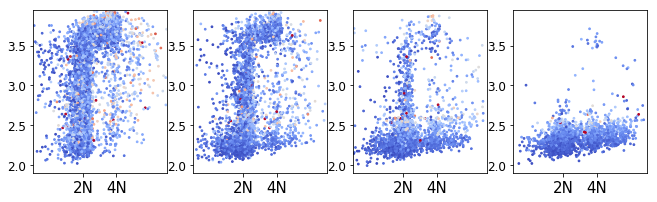

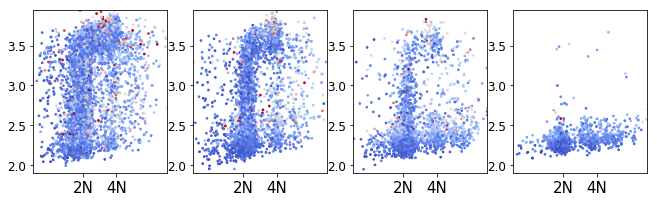

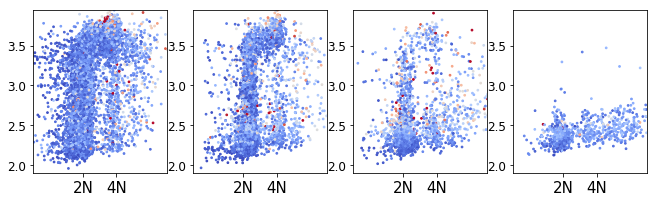

In [31]:
for k, CellLine in enumerate([df1, df2, df3, df4]):

    for i, time in enumerate(['2d', '3d', '4d']):
        plt.figure(i+1+4*k, figsize=(11,3))

        for num, SelectedDrug in enumerate(['DMSO', 'F+BYL0.03', 'F+BYL0.3','F+BYL3']):
            plt.subplot(1, 4, num+1)
            idx = ((CellLine['Treatment']==SelectedDrug) & (CellLine['Time']==time) )

            if k==2:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(  CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N']  ), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10( CellLine.loc[idx]['Content']/CellLine.loc[idx]['DAPI1_N']*CellLine.loc[idx]['DAPI2_N'] )/ConDNA*2
 
            else:
                if SelectedDrug == 'DMSO':
                    ConDNA = np.percentile (np.log10(CellLine.loc[idx]['Content']), 98)
                CellLine.loc[idx, 'Normalized_DNAcontent'] = np.log10(CellLine.loc[idx]['Content'])/ConDNA*2
 
            idx_live = (CellLine['Normalized_DNAcontent']>1.7)
             
            x_all = CellLine.loc[idx & idx_live]['Normalized_DNAcontent']
            y_all = np.log10(CellLine.loc[idx & idx_live]['pRB_N'])
            
            colorIndex =  CellLine.loc[idx & idx_live]['pErk_C']
            
            
            
            s= plt.scatter(x_all, y_all, s=3, c=colorIndex, cmap=cm.coolwarm, vmin=180, vmax=1800)

            plt.xlim(1.7, 2.1)
            plt.ylim(1.9, 3.95)
            #plt.title(time)
            
            plt.xticks([1.85, 1.95], ['2N', '4N'])
            plt.xticks(fontsize=15)
            
            plt.yticks(fontsize=12)

#plt.colorbar()                                    
plt.show()


# Save file

In [32]:
# # Save the final dataframe

# df_Sum.to_csv('.\Set2_summary\SixPop_set2_BCDEFG_pErk_etc.csv')

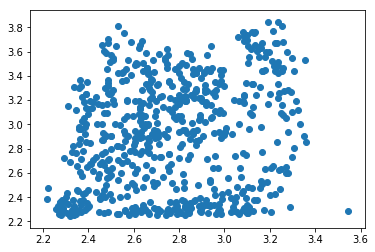

In [33]:
# plt.scatter(df_Sum['pErk_N'],df_Sum['pS6-235_C'])
# plt.show()
            